In [1]:
import netCDF4 as nc
import numpy as np
import pandas as pd
import scipy as sc
import os
import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import windrose as wr

In [ ]:
# df - inplace работает
# df['val'] - inplace работает
# df[['val']] - inplace не работает

In [468]:
A1.A.mean()

0.17187427941781452

In [469]:
A2.A.mean()

0.2008996228274805

In [470]:
A3.A.mean()

0.16063171984362856

### Считывание данных 

In [367]:
# читаем данные мачты и данные метеостанции, 
years = [2020, 2021, 2022, 2023]
A1, A2, A3 = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
A1_v, A2_v, A3_v = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

min_data_availability = 0.90  # минимальное количество данных в периоде осреднения, чтобы он учитывался

for year in years:
    path = f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/A1/{year}/'
    A1 = pd.concat([A1, read_all_files(path, csv_to_df, 'turb_stats')])
    A1_v = pd.concat([A1_v, read_all_files(path, csv_to_df, 'values_per')])
    
    path = f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/A2/{year}/'
    A2 = pd.concat([A2, read_all_files(path, csv_to_df, 'turb_stats')])
    A2_v = pd.concat([A2_v, read_all_files(path, csv_to_df, 'values_per')])
    
    path = f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/A3/{year}/'
    A3 = pd.concat([A3, read_all_files(path, csv_to_df, 'turb_stats')])
    A3_v = pd.concat([A3_v, read_all_files(path, csv_to_df, 'values_per')])

A2['t']+=0.286

print(A1.u.count(), A2.u.count(), A3.u.count())

meteo = pd.read_excel('/Users/ilyadrozd/Desktop/TOWER_DATA/meteo/2020_2023.xlsx')
meteo.SR = [datetime.timedelta(hours=h) for h in meteo.SR]
meteo.DATE += meteo.SR
meteo.index = pd.to_datetime(meteo.DATE)
meteo.drop(['DATE','SR'], axis=1, inplace=True)
meteo.Rain.fillna(0, inplace=True)

A1_meteo = meteo.apply(lambda x: np.interp(x = A1.index,  xp = meteo.index, fp = x))
A1_meteo.index = A1.index
A2_meteo = meteo.apply(lambda x: np.interp(x = A2.index,  xp = meteo.index, fp = x))
A2_meteo.index = A2.index
A3_meteo = meteo.apply(lambda x: np.interp(x = A3.index,  xp = meteo.index, fp = x))
A3_meteo.index = A3.index

A1['P'] = A1_meteo.PPP 
A1[A1_meteo.Rain>=0.1] = np.nan
mask = A1_v<3600*min_data_availability
A1.mask(mask, inplace=True)
A1.dropna(inplace=True)

A2['P'] = A2_meteo.PPP
A2[A2_meteo.Rain>=0.1] = np.nan
mask = A2_v<3600*min_data_availability
A2.mask(mask, inplace=True)
A2.dropna(inplace=True)

A3['P'] = A3_meteo.PPP
A3[A3_meteo.Rain>=0.1] = np.nan
mask = A3_v<3600*min_data_availability
A3.mask(mask, inplace=True)
A3.dropna(inplace=True)

print(A1.u.count(), A2.u.count(), A3.u.count())

for A in [A1, A2, A3]:

    A['H'] = 1030*A.P*100/(287*(A.t+273.15))*A.wt
    A['tau'] = A.P*100/(287*(A.t+273.15))*A.wuh
    A['month'] = A.index.month
    A['hour'] = A.index.hour
    A['strat'] = '3 nt'
    A.loc[A.zeta<-0.01, 'strat'] = '1 un'
    A.loc[A.zeta>0.01, 'strat'] = '2 st'
    
    

Найдено файлов: 7
A1_2020_06_turb_stats_30_min.csv
A1_2020_07_turb_stats_30_min.csv
A1_2020_08_turb_stats_30_min.csv
A1_2020_09_turb_stats_30_min.csv
A1_2020_10_turb_stats_30_min.csv
A1_2020_11_turb_stats_30_min.csv
A1_2020_12_turb_stats_30_min.csv
Прочитано файлов: 7
Найдено файлов: 7
A1_2020_06_values_per_30_min.csv
A1_2020_07_values_per_30_min.csv
A1_2020_08_values_per_30_min.csv
A1_2020_09_values_per_30_min.csv
A1_2020_10_values_per_30_min.csv
A1_2020_11_values_per_30_min.csv
A1_2020_12_values_per_30_min.csv
Прочитано файлов: 7
Найдено файлов: 7
A2_2020_06_turb_stats_30_min.csv
A2_2020_07_turb_stats_30_min.csv
A2_2020_08_turb_stats_30_min.csv
A2_2020_09_turb_stats_30_min.csv
A2_2020_10_turb_stats_30_min.csv
A2_2020_11_turb_stats_30_min.csv
A2_2020_12_turb_stats_30_min.csv
Прочитано файлов: 7
Найдено файлов: 7
A2_2020_06_values_per_30_min.csv
A2_2020_07_values_per_30_min.csv
A2_2020_08_values_per_30_min.csv
A2_2020_09_values_per_30_min.csv
A2_2020_10_values_per_30_min.csv
A2_2020_11

In [428]:
print(A1_summer.t.loc[A1_summer['strat']=='1 un'].count()/A1_summer.t.count(), A1_summer.t.loc[A1_summer['strat']=='2 st'].count()/A1_summer.t.count(),  A1_summer.t.loc[A1_summer['strat']=='3 nt'].count()/A1_summer.t.count())
print(A2_summer.t.loc[A2_summer['strat']=='1 un'].count()/A2_summer.t.count(), A2_summer.t.loc[A2_summer['strat']=='2 st'].count()/A2_summer.t.count(),  A2_summer.t.loc[A2_summer['strat']=='3 nt'].count()/A2_summer.t.count())
print(A3_summer.t.loc[A3_summer['strat']=='1 un'].count()/A3_summer.t.count(), A3_summer.t.loc[A3_summer['strat']=='2 st'].count()/A3_summer.t.count(),  A3_summer.t.loc[A3_summer['strat']=='3 nt'].count()/A3_summer.t.count())
print('')
print(A1_winter.t.loc[A1_winter['strat']=='1 un'].count()/A1_winter.t.count(), A1_winter.t.loc[A1_winter['strat']=='2 st'].count()/A1_winter.t.count(),  A1_winter.t.loc[A1_winter['strat']=='3 nt'].count()/A1_winter.t.count())
print(A2_winter.t.loc[A2_winter['strat']=='1 un'].count()/A2_winter.t.count(), A2_winter.t.loc[A2_winter['strat']=='2 st'].count()/A2_winter.t.count(),  A2_winter.t.loc[A2_winter['strat']=='3 nt'].count()/A2_winter.t.count())
print(A3_winter.t.loc[A3_winter['strat']=='1 un'].count()/A3_winter.t.count(), A3_winter.t.loc[A3_winter['strat']=='2 st'].count()/A3_winter.t.count(),  A3_winter.t.loc[A3_winter['strat']=='3 nt'].count()/A3_winter.t.count())


0.47580842724154826 0.3512371386575208 0.17295443410093092
0.5861058185548879 0.34141873076359375 0.0724754506815184
0.6075657894736842 0.3165296052631579 0.0759046052631579

0.49695618106202155 0.21590018684829124 0.2871436320896872
0.8721313439990412 0.046437773383665885 0.08143088261729282
0.8018858847301068 0.07466564033484076 0.12344847493505244


/var/folders/9b/mz6gplyd4gb2ks60mcv4xhw00000gn/T/ipykernel_16647/1958940900.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/hist/{name}_summer.png', dpi=200)


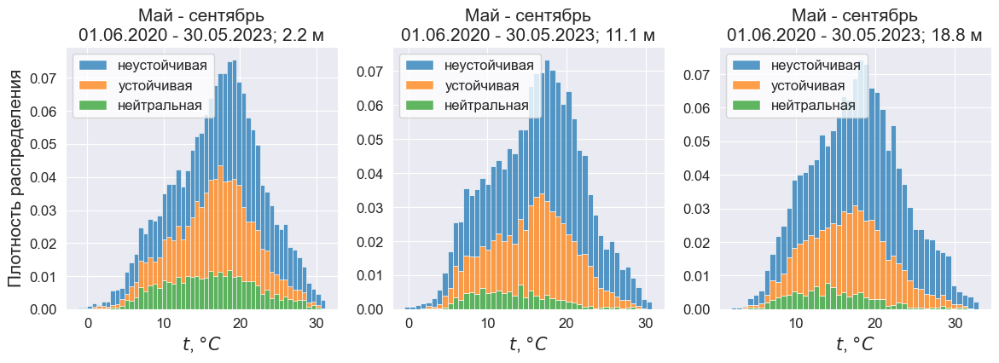

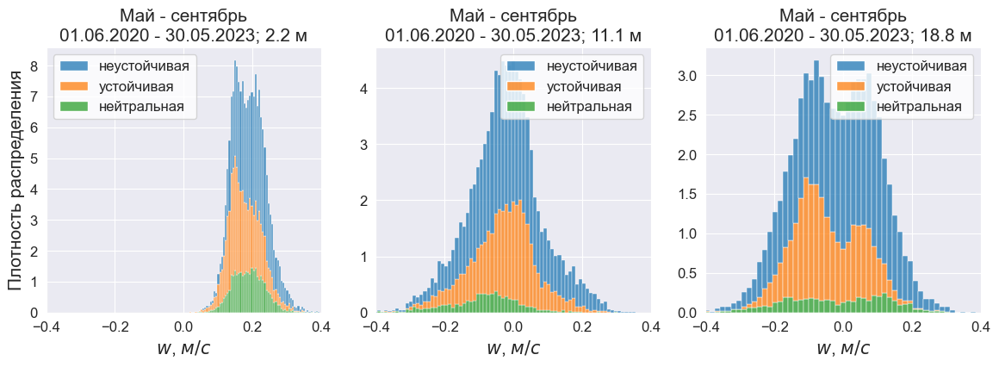

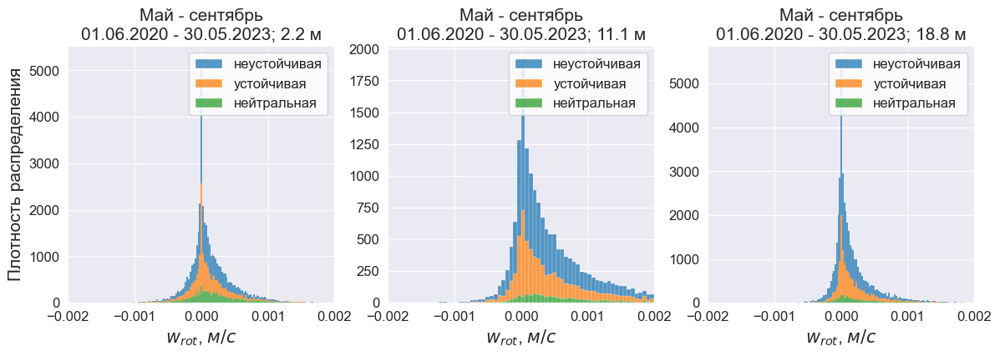

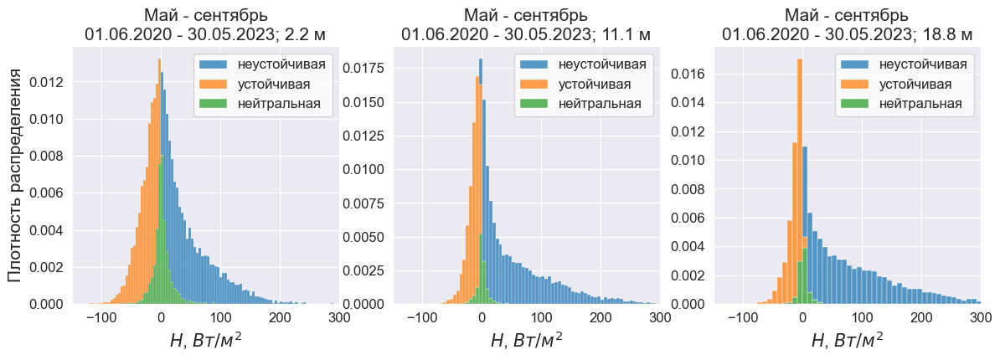

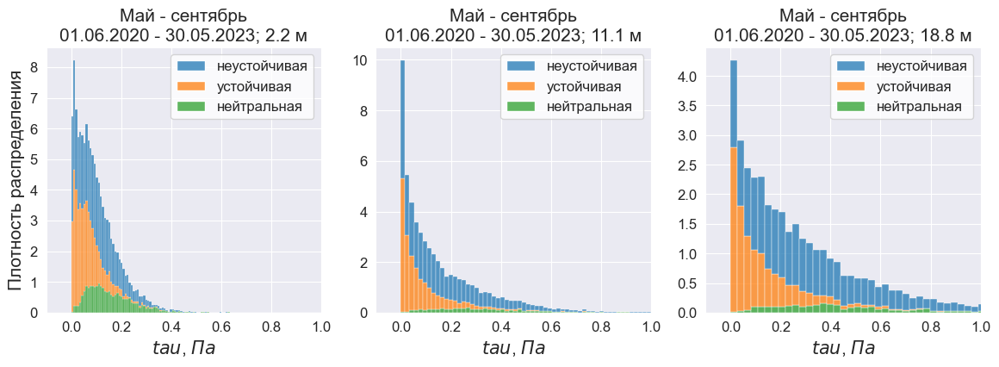

...

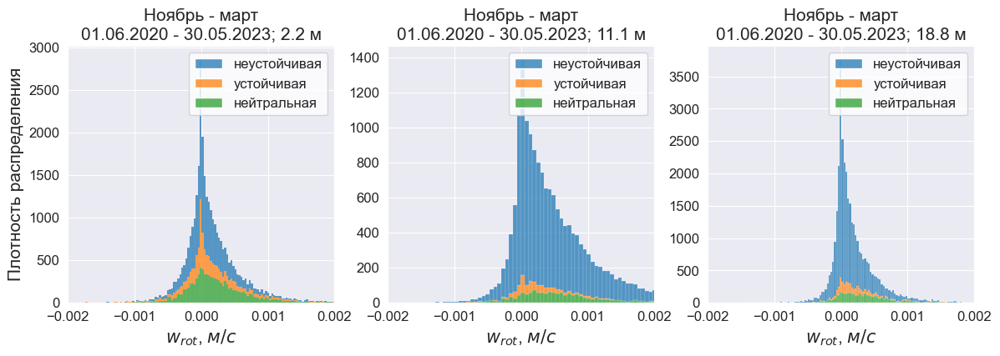

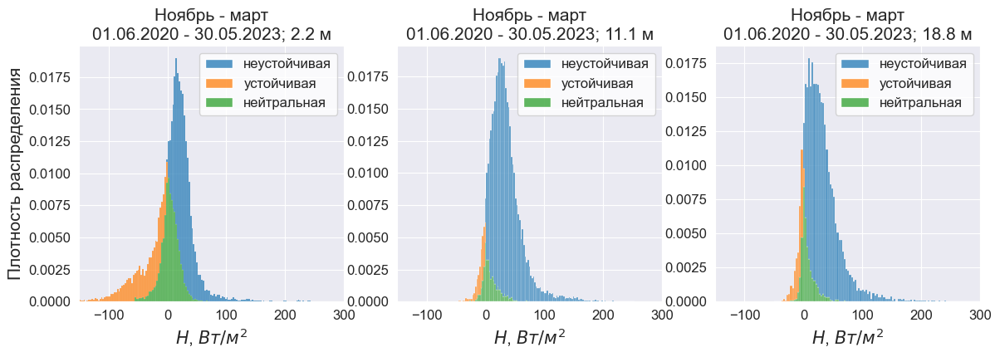

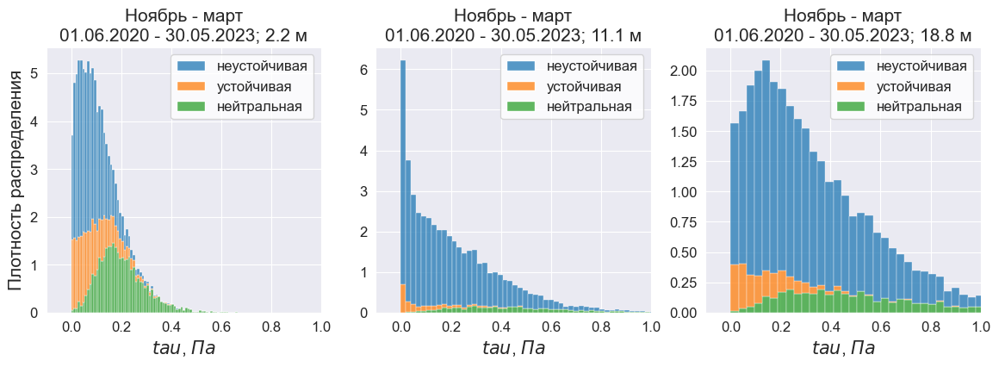

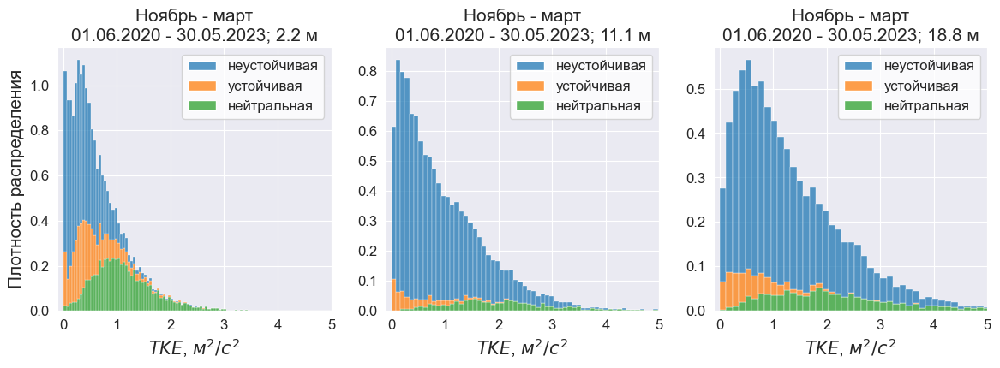

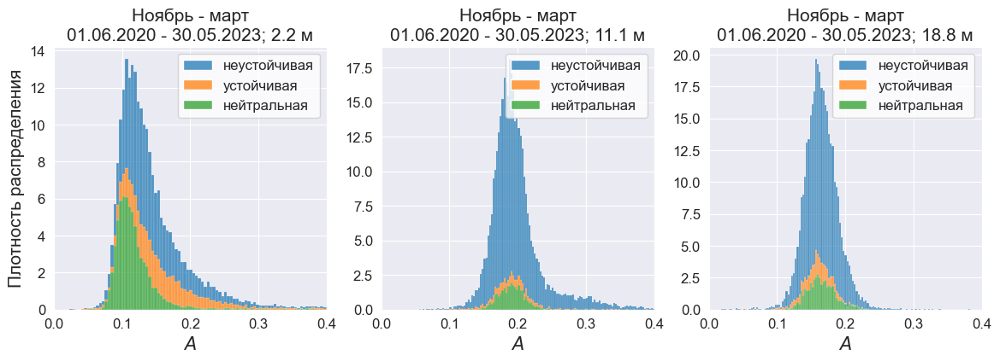

In [420]:
A1_winter = A1.loc[(A1['month']<4)|(A1['month']>10)]
A1_summer = A1.loc[(A1['month']>4)&(A1['month']<10)]
A2_winter = A2.loc[(A2['month']<4)|(A2['month']>10)]
A2_summer = A2.loc[(A2['month']>4)&(A2['month']<10)]
A3_winter = A3.loc[(A3['month']<4)|(A3['month']>10)]
A3_summer = A3.loc[(A3['month']>4)&(A3['month']<10)]

names = ['t', 'w','w_rot', 'H','tau', 'TKE', 'A']

H = [2.2, 11.1, 18.8]
As = [A1_summer, A2_summer, A3_summer] 

sns.set_style("darkgrid")

for name in names:    
    fig, axes = plt.subplots(ncols=3, figsize=(14,4))
    for ax, A, h in zip(axes, As, H):
        sns.histplot(ax=ax, data=A.sort_values('strat'), x=name, hue='strat', stat="density", multiple="stack")
        ax.set_title(f'Май - сентябрь\n01.06.2020 - 30.05.2023; {h} м', fontsize=15)
        
        ax.set_ylabel('')
        axes[0].set_ylabel('Плотность распределения', fontsize=15)
        ax.tick_params(axis='both', labelsize=12)
        
        if name=='t':
            ax.set_xlabel(f'${name}$, $°С$', fontsize=15)
        
        if name=='w':
            ax.set_xlim([-0.4,0.4])
            ax.set_xlabel(f'${name}$, $м/с$', fontsize=15)
            
        if name=='w_rot':
            ax.set_xlim([-0.002,0.002])
            ax.set_xlabel('$w_{rot}$, $м/с$', fontsize=15)

        if name=='H':
            ax.set_xlim([-150,300])
            ax.set_xlabel(f'${name}$, $Вт/м^2$', fontsize=15) 
                          
        if name=='tau': 
            ax.set_xlim([-0.1,1])
            ax.set_xlabel(f'${name}$, $Па$', fontsize=15) 

        if name=='TKE': 
            ax.set_xlim([-0.1,5])
            ax.set_xlabel(f'${name}$, $м^2/с^2$', fontsize=15) 
        
        if name=='A': 
            ax.set_xlim([0,0.4])
            ax.set_xlabel(f'${name}$', fontsize=15) 
            
        legend = ax.get_legend()
        handles = legend.legendHandles
        legend.remove()
        ax.legend(handles, ['неустойчивая', 'устойчивая', 'нейтральная'], fontsize=12, facecolor='w')
    
    fig.savefig(f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/hist/{name}_summer.png', dpi=200)
    plt.show()
    plt.close()


    
As = [A1_winter, A2_winter, A3_winter] 

for name in names:    
    fig, axes = plt.subplots(ncols=3, figsize=(14,4))
    for ax, A, h in zip(axes, As, H):
        sns.histplot(ax=ax, data=A.sort_values('strat'), x=name, hue='strat', stat="density", multiple="stack")
        ax.set_title(f'Ноябрь - март\n01.06.2020 - 30.05.2023; {h} м', fontsize=15)
        
        ax.set_ylabel('')
        axes[0].set_ylabel('Плотность распределения', fontsize=15)
        ax.tick_params(axis='both', labelsize=12)
        
        if name=='t':
            ax.set_xlabel(f'${name}$, $°С$', fontsize=15)
                          
        if name=='w':
            ax.set_xlim([-0.4,0.4])
            ax.set_xlabel(f'${name}$, $м/с$', fontsize=15)
            
        if name=='w_rot':
            ax.set_xlim([-0.002,0.002])
            ax.set_xlabel('$w_{rot}$, $м/с$', fontsize=15)

        if name=='H':
            ax.set_xlim([-150,300])
            ax.set_xlabel(f'${name}$, $Вт/м^2$', fontsize=15) 
                          
        if name=='tau': 
            ax.set_xlim([-0.1,1])
            ax.set_xlabel(f'${name}$, $Па$', fontsize=15) 

        if name=='TKE': 
            ax.set_xlim([-0.1,5])
            ax.set_xlabel(f'${name}$, $м^2/с^2$', fontsize=15)
        
        if name=='A': 
            ax.set_xlim([0,0.4])
            ax.set_xlabel(f'${name}$', fontsize=15) 
            
        legend = ax.get_legend()
        handles = legend.legendHandles
        legend.remove()
        ax.legend(handles, ['неустойчивая', 'устойчивая', 'нейтральная'], fontsize=12, facecolor='w')
    
    fig.savefig(f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/hist/{name}_winter.png', dpi=200)
    plt.show()
    plt.close()

    

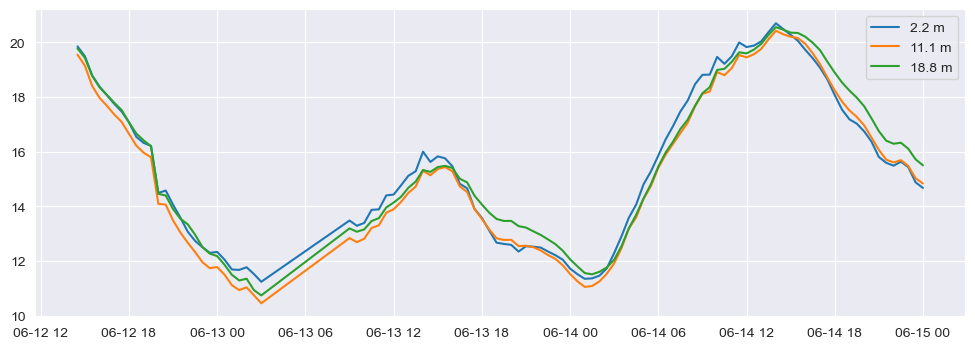

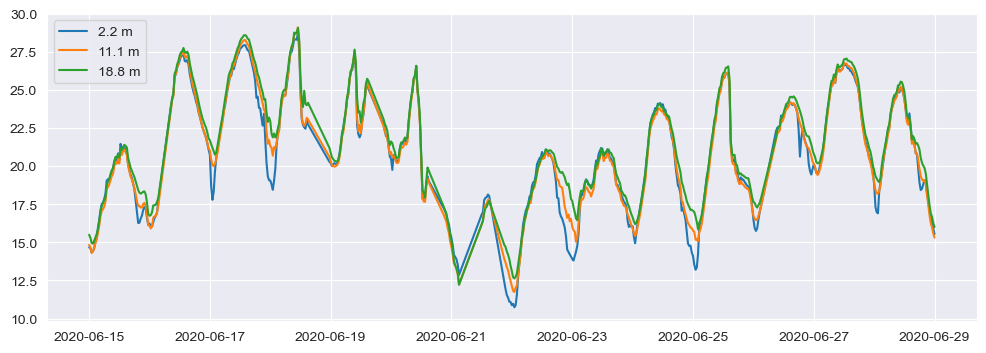

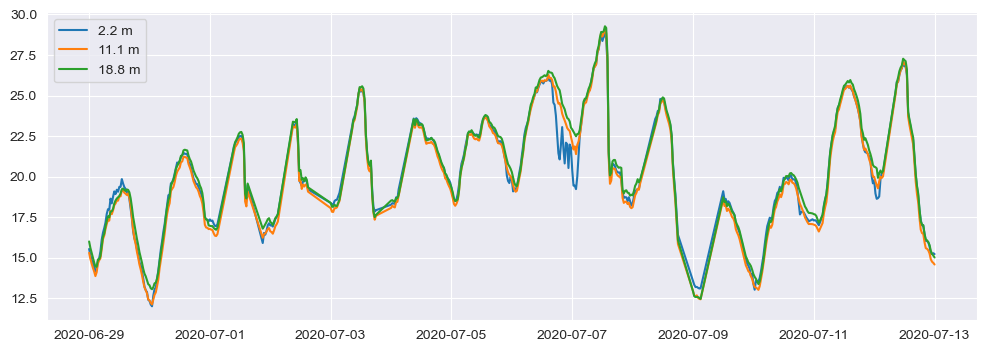

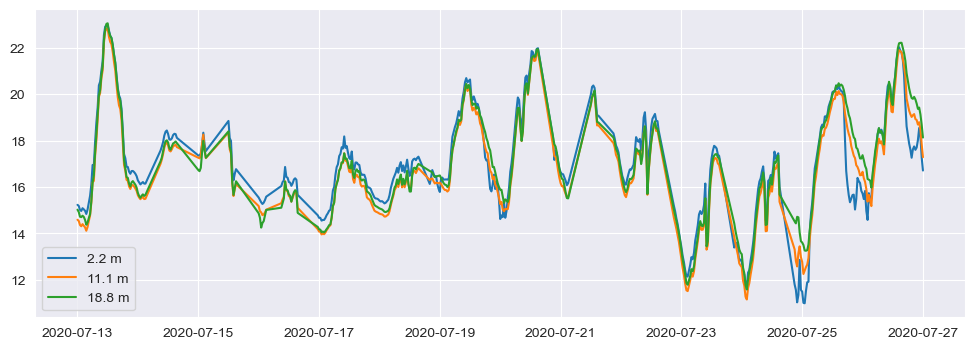

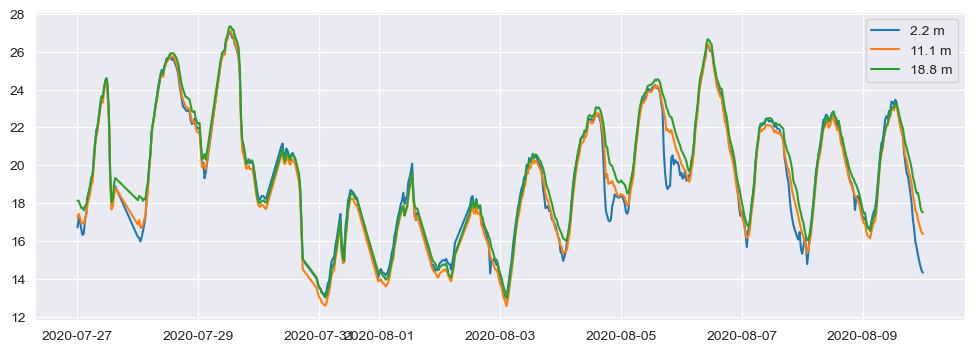

...

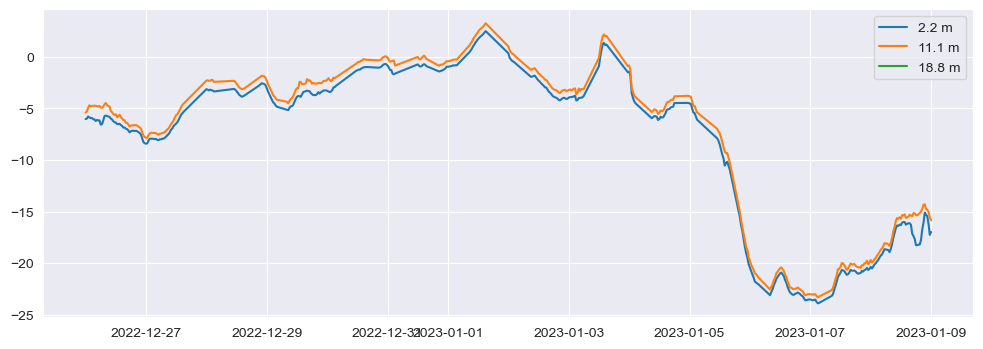

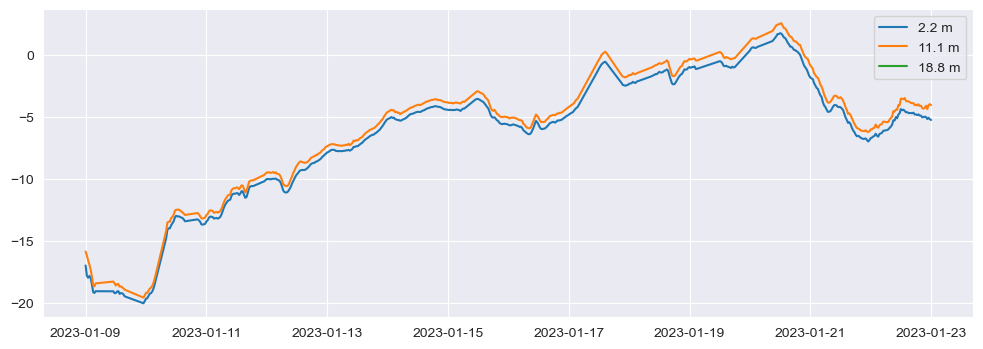

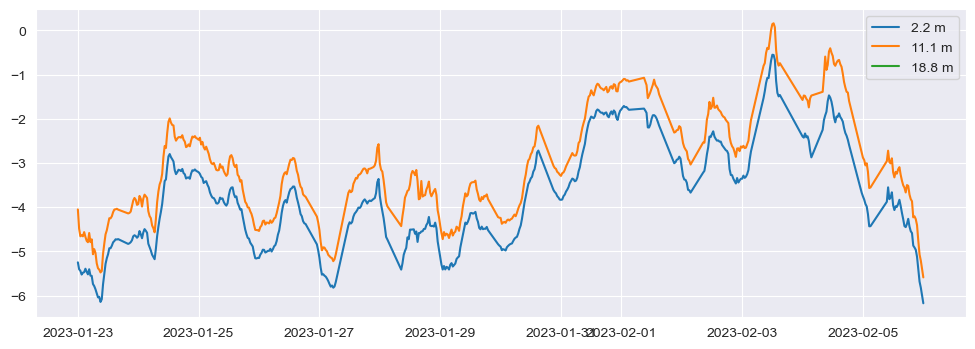

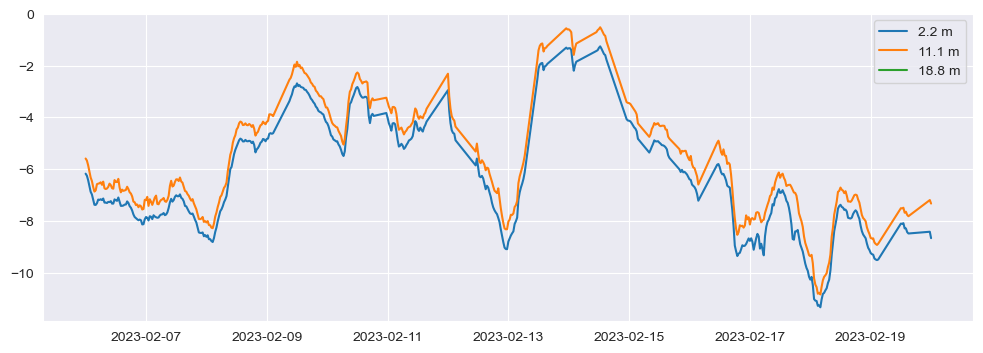

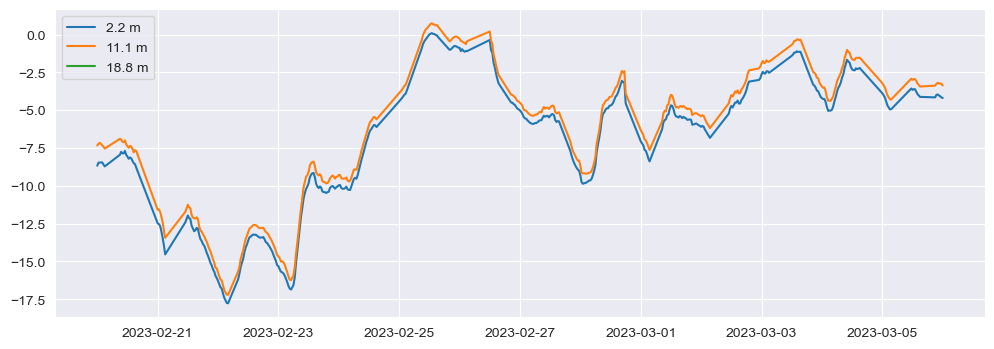

In [361]:
start = pd.to_datetime('2020-06-01 00:00:00')
stop = pd.to_datetime('2023-06-01 00:00:00.0001')
time = pd.DataFrame(np.arange(start,stop,step), index = np.arange(start,stop,step),columns=['time'])

for i in range(72):
    plt.figure(figsize=(12,4))
    plt.plot(A1.H.loc[start+i*step*672:start+(i+1)*step*672], label='2.2 m')
    plt.plot(A2.H.loc[start+i*step*672:start+(i+1)*step*672], label='11.1 m')
#     plt.plot(A3.H.loc[start+i*step*672:start+(i+1)*step*672], label='18.8 m')
    plt.legend()
    plt.show()
    plt.close()

### Отрисовка диаграмм рассеяния

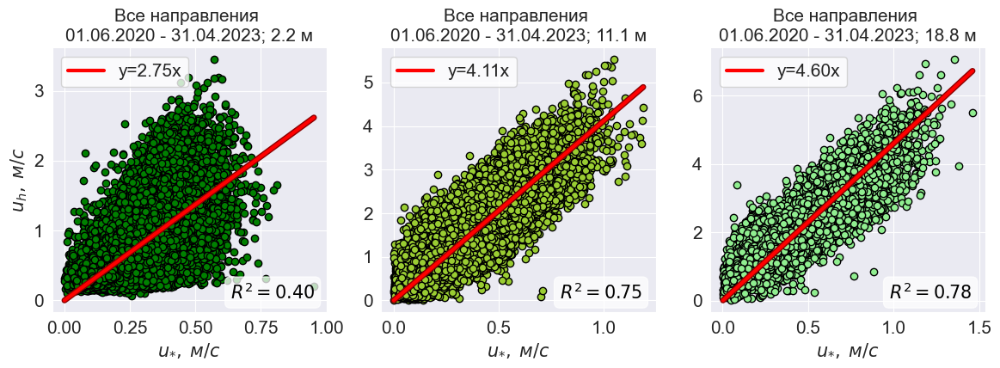

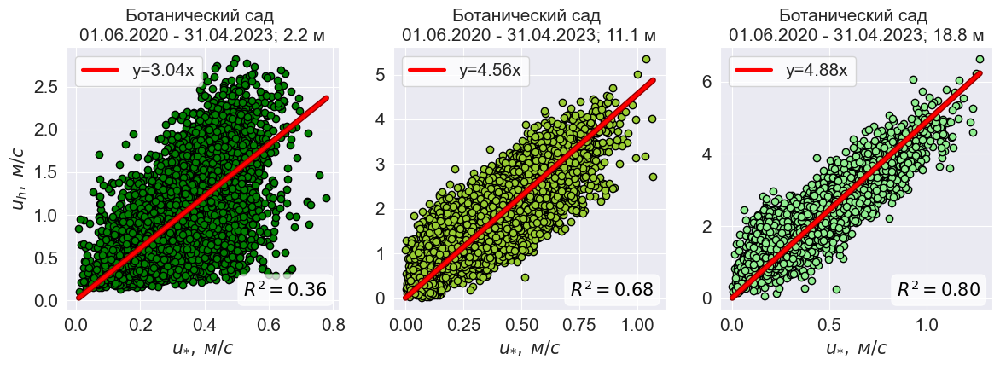

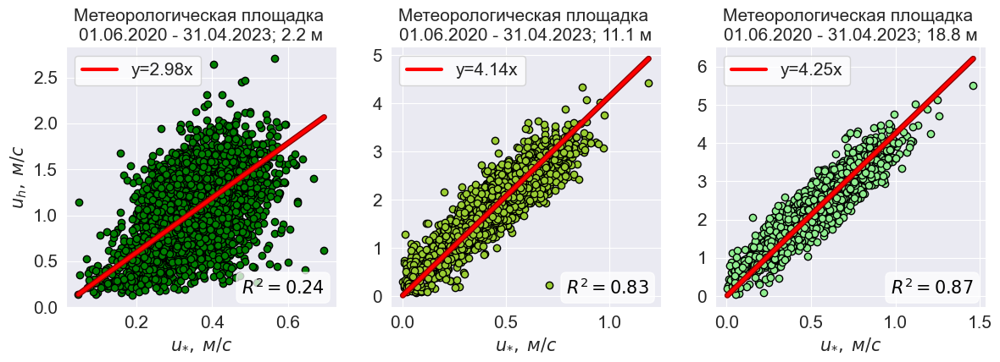

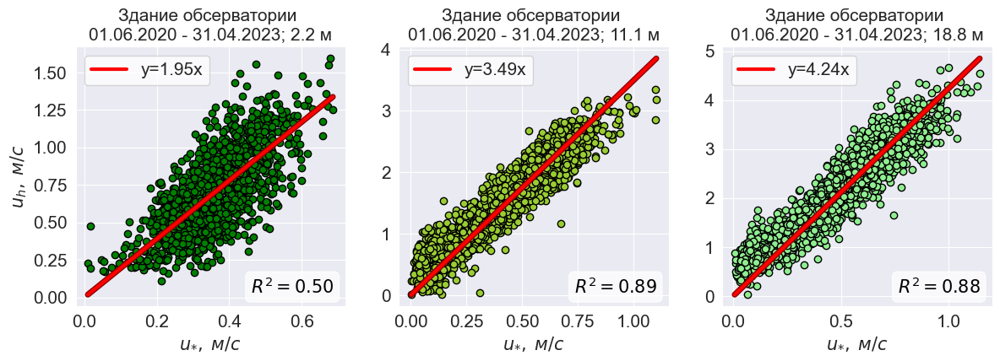

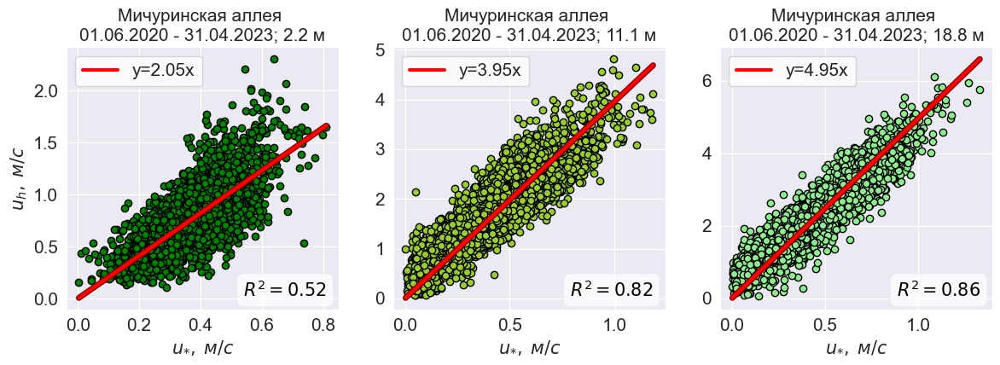

...

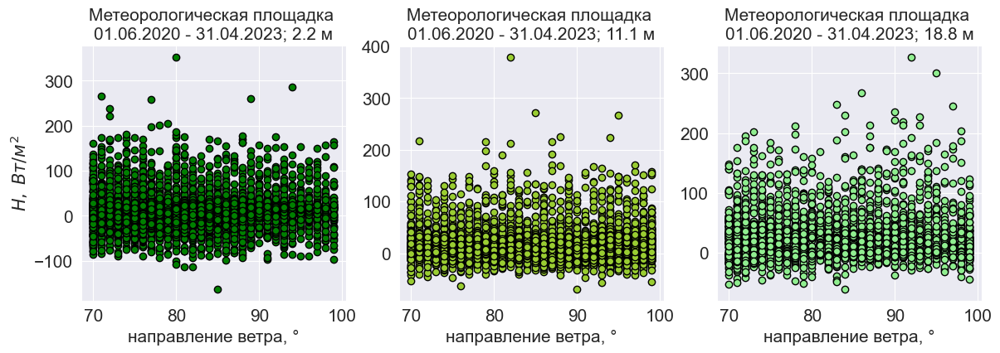

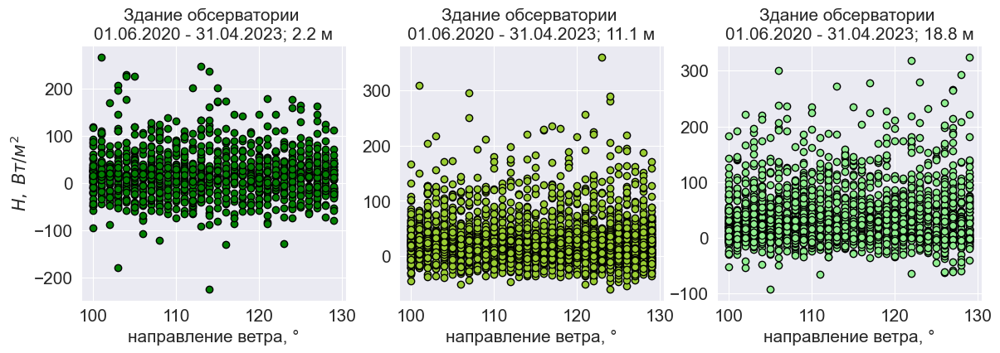

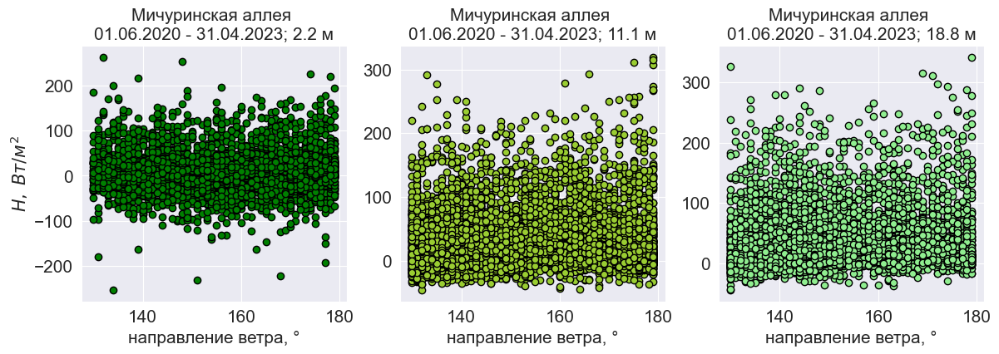

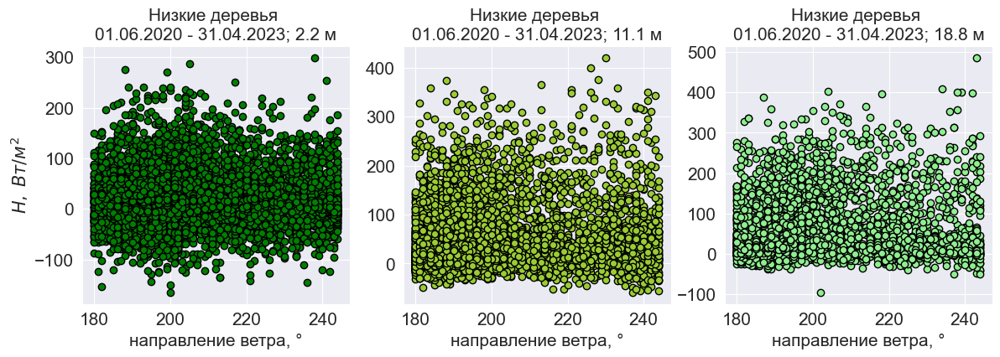

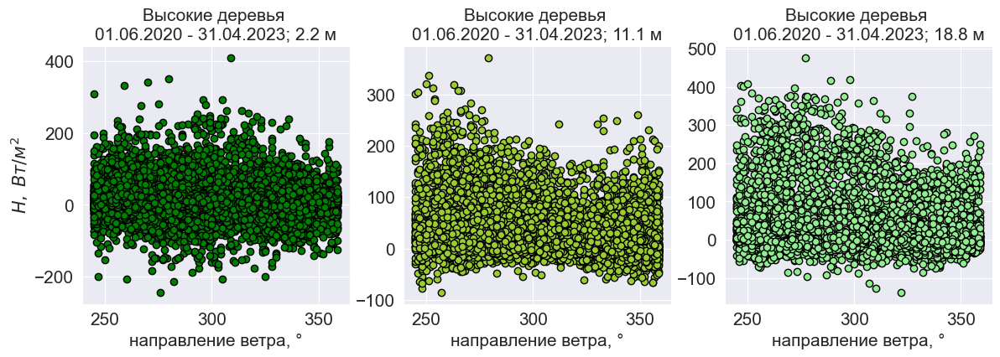

In [383]:
def label1(coef):
    return f'y=%.2fx'%(coef)

def label2(coef):
    return f'$y=%.2fx^2$'%(coef)

labels = [label1, label2, label2, '', '']
funcs = [aX, aX2, aX2, '', '']
ys = ['abs_uh','TKE','wuh','tau','H']
xs = ['u_star','u_star','abs_uh','dir_uh','dir_uh']

y_names = ['$u_{h},$ $м/с$', '$TKE,$ $м^2/с^2$', "$\overline{w'u_{h}'},$ $м^2/с^2$",'$tau,$ $Па$','$H,$ $Вт/м^2$']
x_names = ['$u_{*},$ $м/с$', '$u_{*},$ $м/с$', '$u_{h},$ $м/с$','направление ветра, °', 'направление ветра, °']

As = [A1, A2, A3] 
colors = ['green', 'yellowgreen', 'lightgreen']
H = [2.2, 11.1, 18.8]

line_of_trend = True
scatter = True
kde = False


sectors = ['Все направления','Ботанический сад','Метеорологическая площадка',
           'Здание обсерватории','Мичуринская аллея','Низкие деревья','Высокие деревья']
min_dirs = [  0, 0, 70,100,130,180,245]
max_dirs = [360,70,100,130,180,245,360]
wd = 'dir_uh'


for x, y, func, label, x_name, y_name in zip(xs, ys, funcs, labels, x_names, y_names):
    
    if x == 'dir_uh':
        label=False
        line_of_trend=False
        scatter=True
        kde=False
        
    
    for min_d, max_d, sector in zip(min_dirs, max_dirs, sectors):
  
        sns.set_style("darkgrid")
        fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, figsize=(14,4))
        axs = (axs1, axs2, axs3)
        
        for ax, A, c, h in zip(axs, As, colors, H):
            
            df_sec = A.loc[(A[wd]>=min_d)&(A[wd]<max_d)].copy() 

            if scatter: 
                ax.scatter(df_sec[x], df_sec[y], c=c, edgecolor='k')

            if kde:
                sns.kdeplot(x=df_sec[x], y=df_sec[y], cmap='Blues', ax=ax, fill=True, thresh=0)

            if label == label1:
                r, _ = sc.stats.pearsonr(df_sec[x], df_sec[y]) # pearson
                props = dict(boxstyle='round', facecolor='w', alpha=0.75)
                text = '$R^2=%.2f$'%(r**2)
                ax.text(0.65, 0.05, text, fontsize=15, color='k', transform=ax.transAxes, bbox = props) 
            elif label == label2:
                r, _ = sc.stats.pearsonr(df_sec[x]**2, df_sec[y])
                props = dict(boxstyle='round', facecolor='w', alpha=0.75)
                text = '$R^2=%.2f$'%(r**2)
                ax.text(0.65, 0.05, text, fontsize=15, color='k', transform=ax.transAxes, bbox = props)

            if line_of_trend:
                df = df_sec[[x,y]].copy()
                df.dropna(inplace=True)
                df.sort_values(by=x, inplace=True)
                coef, _ = sc.optimize.curve_fit(func, df[x], df[y])
                trend = func(df[x],*coef)
                ax.plot(df[x], trend, c='darkred', lw=5)
                ax.plot(df[x], trend, c='red', lw=3, label=label(*coef))

            ax.set_title(f'{sector} \n01.06.2020 - 31.04.2023; {h} м', fontsize=15)
            ax.set_xlabel(x_name, fontsize=15)
            axs1.set_ylabel(y_name, fontsize=15)
            ax.tick_params(axis='both', labelsize=15)
            ax.grid(c='w')
            if x != 'dir_uh': ax.legend(fontsize=15, facecolor='w')
            
        fig.savefig(f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/sectors/{sector}_{x}_{y}.png', dpi=200)
        plt.show()
        plt.close()

In [432]:
np.e**(np.log(11.1)-3.49*0.4)

2.7481971319875376

In [462]:
A3.tau.mean()

0.3116724625065402

In [464]:
A2.tau.mean()

0.18932214932013955

In [463]:
A1.tau.mean()

0.11246052904880913

In [465]:
A1.H.mean()

11.615014234486935

In [467]:
A2.H.mean()

32.109224653170315

In [466]:
A3.H.mean()

37.52115214053995

In [434]:
np.e**(np.log(18.8)-4.24*0.4)

3.448215565472994

In [435]:
np.e**(np.log(18.8)-4.88*0.4)

2.6694083866753404

In [437]:
print(np.e**(np.log(11.1)-3.49*0.4) - np.e**(np.log(11.1)-4.56*0.4))
print(np.e**(np.log(18.8)-4.24*0.4) - np.e**(np.log(18.8)-4.88*0.4))

0.9568908712409225
0.7788071787976536


### Отрисовка join pdf

In [452]:
df = nc_to_df('/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/A3/2020/06/MSU_A3_2020-06-27.nc')
df.index = pd.to_datetime(df.index, unit='s')

step = datetime.timedelta(minutes=30)
start = pd.to_datetime('2020-06-27 00:00:00')
stop = pd.to_datetime('2020-06-28 00:00:00.000001')
trend = detrend(df, step, start=start, stop=stop, mode='trend', min_val=3)

df

,u,v,w,t
2020-06-27 00:00:00.030536704,-0.96,-0.25,0.43,21.030001
2020-06-27 00:00:00.080588544,-0.98,-0.24,0.46,21.040001
2020-06-27 00:00:00.130685440,-1.11,-0.35,0.25,21.059999
2020-06-27 00:00:00.180466688,-1.11,-0.37,0.22,21.059999
2020-06-27 00:00:00.230692608,-1.27,-0.47,0.08,21.090000
...,...,...,...,...
2020-06-27 23:59:59.775460352,-1.05,2.31,-0.45,19.790001
2020-06-27 23:59:59.825446400,-1.03,2.47,-0.39,19.809999
2020-06-27 23:59:59.875376640,-0.93,2.42,-0.52,19.780001
2020-06-27 23:59:59.925574144,-0.92,2.35,-0.45,19.780001


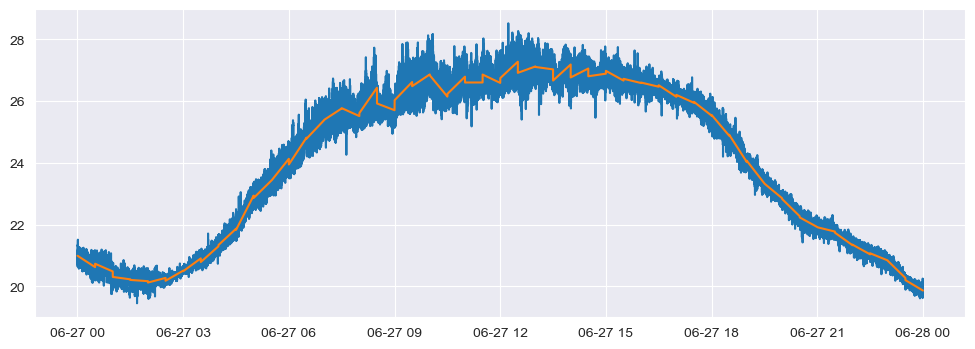

In [453]:
plt.figure(figsize=(12,4))
plt.plot(df.t)
plt.plot(trend.t)

In [454]:
absolute_limits(df.u, Max=30, Min=-30)
absolute_limits(df.v, Max=30, Min=-30)
absolute_limits(df.w, Max=5, Min=-5)
absolute_limits(df.t, Max=40, Min=-40)

df[['t','u','v']] = drop_spikes(df[['t','u','v']], step, nsig=3.5, n=3, start=start, stop=stop)
df['w'] = drop_spikes(df.w, step, nsig=5, n=3, start=start, stop=stop)                


df = detrend(df, step, start=start, stop=stop, mode='detrend', min_val=3)

Удалено значений u: 0
Удалено значений v: 0
Удалено значений w: 14
Удалено значений t: 0
Value: t, iteration: 1, missing values: 0, delited spikes:652, total gaps:652 (0.04%)
Value: t, iteration: 2, missing values: 652, delited spikes:75, total gaps:727 (0.04%)
Value: t, iteration: 3, missing values: 727, delited spikes:0, total gaps:727 (0.04%)
Value: u, iteration: 1, missing values: 0, delited spikes:464, total gaps:464 (0.03%)
Value: u, iteration: 2, missing values: 464, delited spikes:34, total gaps:498 (0.03%)
Value: u, iteration: 3, missing values: 498, delited spikes:2, total gaps:500 (0.03%)
Value: u, iteration: 4, missing values: 500, delited spikes:1, total gaps:501 (0.03%)
Value: u, iteration: 5, missing values: 501, delited spikes:0, total gaps:501 (0.03%)
Value: v, iteration: 1, missing values: 0, delited spikes:292, total gaps:292 (0.02%)
Value: v, iteration: 2, missing values: 292, delited spikes:16, total gaps:308 (0.02%)
Value: v, iteration: 3, missing values: 308, del

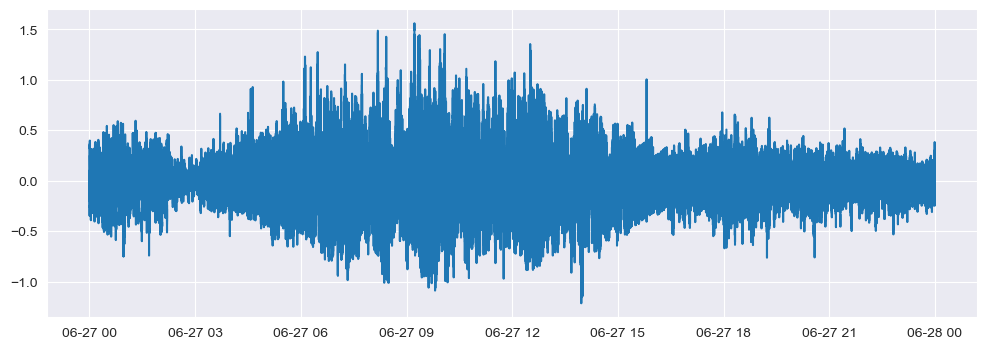

In [455]:
plt.figure(figsize=(12,4))
plt.plot(df.t)

In [450]:
500/A3.u_star.mean()/60

18.455789398976783

In [449]:
500/A2.u_star.mean()/60

24.58007876203029

In [451]:
500/A1.u_star.mean()/60

30.09708285114866

In [460]:
30/4

7.5

0.25 0:07:30


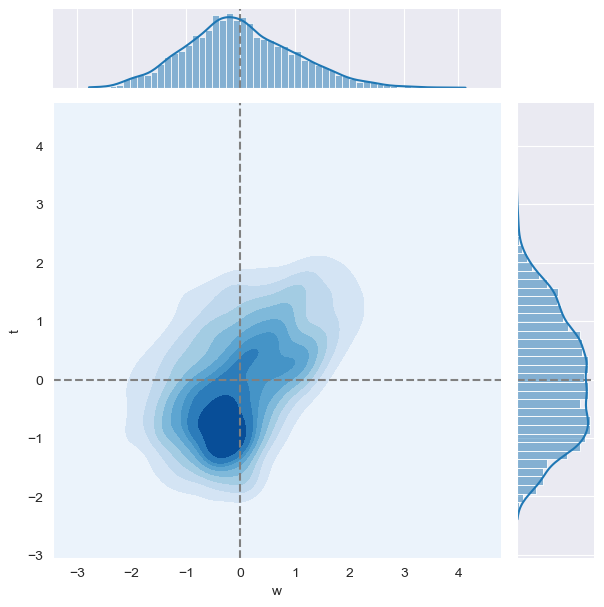

In [461]:
# for i in [0,8,16,24,32,40]: # 8,12,16,20,24,28,32,36,40,44]
i=0.25
step = datetime.timedelta(minutes=30)
start = pd.to_datetime('2020-06-27 12:00:00')

print(i, f'{i*step}')
oapd = df.loc[start:start+i*step].copy()
oapd['w'] -= oapd.w.mean()
oapd['w'] /= oapd.w.std()
oapd['t'] -= oapd.t.mean()
oapd['t'] /= oapd.t.std()

x, y = oapd.w, oapd.t

g = sns.JointGrid()
g.refline(x=0, y=0)
sns.kdeplot(x=x, y=y, cmap='Blues', ax=g.ax_joint, fill=True, thresh=0)
sns.histplot(x=x,  ax=g.ax_marg_x, kde=True)
sns.histplot(y=y,  ax=g.ax_marg_y, kde=True)
plt.show()
plt.close()



In [ ]:
#таблицы характеристик третьих моментов по секторам

nt_str = 0.05
drop_max = '' #'1%' #'std3'
min_ws = 0
ma = f'lin_nt_str_{nt_str}'

beta_0 = 1
alfa_0 = 0
R_0 = 0 
alfa = False
a = 0.05

sectors = ['Все направления','Ботанический сад','Метеорологическая площадка',
           'Здание обсерватории','Мичуринская аллея','Низкие деревья','Высокие деревья']
min_dirs = [  0, 0, 70,100,130,180,245]
max_dirs = [360,70,100,130,180,245,360]
#min_d, max_d, sn, ma = sector_boundaries(step=45, ma=ma) #разбитие на сектора с одинаковым шагом 

H = ['2.2','11.1','18.8']
lvl = [A1,A2,A3]

for h, A in zip(H, lvl): #цикл по высоте
    
    for moment in ('wwt','wtt','wuu','wvv'): #цикл по моментам
        
        out_dir = f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/bar/{moment}/'
        file_name = f'{h}_{moment}_{ma}_B{beta_0}_A{alfa_0}_R{R_0}_A{str(alfa)[0]}.csv'
        
        third_moments_table(A, f'{moment}_th', moment, 'abs_uh', 'dir_uh', 'zeta',
                            file_name, out_dir, min_dirs, max_dirs, sectors, nt_str, 
                            drop_max, min_ws, beta_0, alfa_0, R_0, alfa, a)
        

In [ ]:
# Столбчатые диаграммы

for h in ['2.2','11.1','18.8']:
    ma = f'lin_nt_str_{nt_str}'

    # sn = ['All directions','Botanical\ngarden','Meteorological\nsite','Observatory\nbuilding','Michurinskaya\nalley','Low\ntrees','Tall\ntrees']
    sectors = ['Все\nнаправления','Ботанический\nсад','Метеорологическая\nплощадка',
               'Здание\nобсерватории','Мичуринская\nаллея','Низкие\nдеревья','Высокие\nдеревья']
    #min_d, max_d, sn, ma = sector_boundaries(step=45, ma=ma) #разбитие на сектора с одинаковым шагом 
    sectors = ['0'] + sectors

    for moment in ('wwt','wtt','wuu','wvv'):

        file_name = f'{h}_{moment}_{ma}_B1_A0_R0_AF'
        out_dir = f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/bar/{moment}/'

        if moment == 'wwt': Ci, Ri = '$_{w}$', '$_{wwt}$'
        if moment == 'wtt': Ci, Ri = '$_{t}$', '$_{wtt}$'
        if moment == 'wuu': Ci, Ri = '$_{u}$', '$_{wuu}$'
        if moment == 'wvv': Ci, Ri = '$_{v}$', '$_{wvv}$'

        th = '$_{th}$'
        title = f'Январь 2021 - Декабрь 2022; {h} м; {moment}=C{Ci} $\cdot$ {moment}{th}'#$y=C${Ci}$\cdot x+α$'

        tm = pd.read_csv(out_dir+f'{file_name}.csv')
        #tm.drop('Все направления',axis=1, inplace=True)
        tm.set_index('name',inplace=True)
        #tm.fillna(0)

        # коэффициенты детерминации и регреции, p-value
        R21, R22, R23 = tm[0:1].values[0], tm[1:2].values[0], tm[2:3].values[0]
        C1, C2, C3 = tm[3:4].values[0], tm[4:5].values[0], tm[5:6].values[0]
        p_val1, p_val2, p_val3 = tm[12:13].values[0], tm[13:14].values[0], tm[14:15].values[0]

        # длина ряда
        len1, len2, len3 = tm[51:52].values[0], tm[52:53].values[0], tm[53:54].values[0]

        # доверительные интервалы для R и С
        ciR21, ciR22, ciR23 = tm[18:19].values[0], tm[19:20].values[0], tm[20:21].values[0]
        ciC1, ciC2, ciC3 = tm[21:22].values[0], tm[22:23].values[0], tm[23:24].values[0]

        sector_bar(C1, C2, C3, ciC1, ciC2, ciC3, len1, len2, len3, out_dir, title=title, ylabel=f'$C${Ci}', 
                   file_name=f'{file_name}_C.png', xticklabels=sectors, ylim=[0,4], y_len=0.05, hip_0=1)

        sector_bar(R21, R22, R23, ciR21, ciR22, ciR23, len1, len2, len3, out_dir, title=title, ylabel=f'$R^2${Ri}',  
                   file_name=f'{file_name}_R2.png', xticklabels=sectors, ylim=[0,1], y_len=0.01)

        sector_bar(p_val1, p_val2, p_val3, None, None, None, len1, len2, len3, out_dir, title=title, ylabel=f'$p$-$value$ {Ri}', 
                   file_name=f'{file_name}_p_val.png', xticklabels=sectors, ylim=None, y_len=0, log=True, hip_0=0.01)


In [ ]:
# отрисовка диаграмм рассеяния по третьим моментам
month = 'All time' #папка, в котрую данные будут сохраняться
data = 'Январь 2021 - Декабрь 2022'
drop_max = '' #'1%','std3'
min_ws = 0
nt_str = 0.05
ma = f'lin_nt_str_{nt_str}'
str_name = 'all_str' #'','stable','unstable','netrual'


# Параметры регрессионной модели
beta_0 = 1
alfa_0 = 0
R_0 = 0 
alfa = False 
a = 0.05

# sectors = ['All directions','Botanical garden','Meteorological site',
#            'Observatory building','Michurinskaya alley','Low trees','Tall trees']

sectors = ['Все направления','Ботанический сад','Метеорологическая площадка',
           'Здание обсерватории','Мичуринская аллея','Низкие деревья','Высокие деревья']
min_dirs = [  0, 0, 70,100,130,180,245]
max_dirs = [360,70,100,130,180,245,360]
#min_d, max_d, sn, ma = sector_boundaries(step=45, ma=ma) #разбитие на сектора с одинаковым шагом 

lvl = [A1,A2,A3]
H = ['2.2','11.1','18.8']
colors = ['green','yellowgreen','lightgreen']

for A, h, c in zip(lvl, H, colors): #цикл по высоте    
    
    for min_d, max_d, sector in zip(min_dirs, max_dirs, sectors): #цикл по секторам
        
        title = f'{sector}\n{data}; {h} м'
        out_dir = '/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/scatter/'
        
        
        # wwt
        ylabel = "$\overline{w'w't'},$ $°С \cdot м^2/с^2$"
        xlabel = "$\overline{w'w't'}_{th},$ $°С \cdot м^2/с^2$"
        file_name = f'{h}_{sector}_wwt_{ma}_{str_name}_R{R_0}_B{beta_0}_A{alfa_0}{str(alfa)[0]}.png'

        third_moment_scatter(A, 'wwt_th', 'wwt', 'abs_uh', 'dir_uh', 'zeta', 
                             str_name, nt_str, file_name, os.path.join(out_dir,'wwt'),
                             ylabel, xlabel, title, c, [-0.12,0.12], [-0.12,0.12],
                             drop_max, min_ws, min_d, max_d, 
                             beta_0, alfa_0, R_0, alfa, a)

        
        # wtt
        ylabel = "$\overline{w't't'},$ $°С^2 \cdot м/с$"
        xlabel = "$\overline{w't't'}_{th},$ $°С^2 \cdot м/с$"
        file_name = f'{h}_{sector}_wtt_{ma}_{str_name}_R{R_0}_B{beta_0}_A{alfa_0}{str(alfa)[0]}.png'

        third_moment_scatter(A, 'wtt_th', 'wtt', 'abs_uh', 'dir_uh', 'zeta',
                             str_name, nt_str, file_name, os.path.join(out_dir,'wtt'),
                             ylabel, xlabel, title, c, [-0.12,0.12], [-0.12,0.12],
                             drop_max, min_ws, min_d, max_d, 
                             beta_0, alfa_0, R_0, alfa, a)

        
        # wuu
        ylabel = "$\overline{w'u'u'},$ $м^3/с^3$"
        xlabel = "$\overline{w'u'u'}_{th},$ $м^3/с^3$"
        file_name = f'{h}_{sector}_wuu_{ma}_{str_name}_R{R_0}_B{beta_0}_A{alfa_0}{str(alfa)[0]}.png'

        third_moment_scatter(A, 'wuu_th', 'wuu', 'abs_uh', 'dir_uh', 'zeta',
                             str_name, nt_str, file_name, os.path.join(out_dir,'wuu'),
                             ylabel, xlabel, title, c, [-0.52,0.52], [-0.52,0.52],
                             drop_max, min_ws, min_d, max_d, 
                             beta_0, alfa_0, R_0, alfa, a)
        
        
        # wvv
        ylabel = "$\overline{w'v'v'},$ $м^3/с^3$"
        xlabel = "$\overline{w'v'v'}_{th},$ $м^3/с^3$"
        file_name = f'{h}_{sector}_wvv_{ma}_{str_name}_R{R_0}_B{beta_0}_A{alfa_0}{str(alfa)[0]}.png'

        third_moment_scatter(A, 'wvv_th', 'wvv', 'abs_uh', 'dir_uh', 'zeta',
                             str_name, nt_str, file_name, os.path.join(out_dir,'wvv'),
                             ylabel, xlabel, title, c, [-0.012,0.012], [-0.012,0.012],
                             drop_max, min_ws, min_d, max_d, 
                             beta_0, alfa_0, R_0, alfa, a)

In [ ]:
# Построение роз ветра
# xticklabels = ['Meteorological\nsite','Botanical garden','Botanical\ngarden','Tall\ntrees','Tall trees','\nLow trees','Michurinskaya\nalley ','Observ.\nbuilding']
xticklabels = ['Метеорологическая\nплощадка', 'Ботанический\nсад', 'Ботанический\nсад', 'Высокие\nдеревья',
               '', '\nНизкие деревья', 'Мичуринская\nаллея', 'Здание\n           обсерватории']
h=2.2
wind_rose(ws=A1.abs_uh, wd=A1.dir_uh, zero_location='SW', xticklabels=xticklabels, legend_loc='upper right',
          title='', fale_name=f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/Wind_rose_tower_{h}.png')
h=11.1
wind_rose(ws=A2.abs_uh, wd=A2.dir_uh, zero_location='SW', xticklabels=xticklabels, legend_loc='upper right',
          title='', fale_name=f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/Wind_rose_tower_{h}.png')
h=18.8
wind_rose(ws=A3.abs_uh, wd=A3.dir_uh, zero_location='SW', xticklabels=xticklabels, legend_loc='upper right',
          title='', fale_name=f'/Users/ilyadrozd/Desktop/TOWER_DATA/ncdf/output/Wind_rose_tower_{h}.png')

# xticklabels=['     Botanical\n  garden','Tall\ntrees','\nTall trees','Low\ntrees','Michur. \nalley ','Observ.\nbuilding','Meteorological site','Botanical\ngarden']
# wind_rose(ws=meteo['wind_speed'], wd=meteo['wind_dir'], title=f'Wind rose Meteo observatory data 15 m', zero_location='E',
#           xticklabels=xticklabels, legend_loc='center right', fale_name=f'Wind_rose_observatory_15.png')

### Функции

In [309]:
pd.to_datetime?

In [311]:
def csv_to_df(file):
    return pd.read_csv(file, index_col=0)

def read_all_files(path, func, extension, log=None):
    
    files = os.listdir(path)
    files = [file for file in files if extension in file]
    files.sort()
    
    i=0
    df = pd.DataFrame()
    print(f'Найдено файлов: {len(files)}', file=log)
    for file in files:
        try:
            new_df = func(os.path.join(path,file))

            df = pd.concat([df,new_df])
            print(f'{file}', file=log)
            i+=1
        except:
            print(f'Ошибка: {file}', file=log)
            break
    df.index = pd.to_datetime(df.index, format = '%Y-%m-%d %H:%M:%S' )
    print(f'Прочитано файлов: {i}', file=log)
    return df

In [5]:
# построение роз ветров
def wind_rose(ws, wd, title, zero_location, xticklabels, legend_loc, fale_name):
    fig = plt.figure(figsize=(8,8))
    ax = wr.WindroseAxes.from_ax(fig=fig)
    ax.bar(wd,ws,normed=True, opening=0.9,edgecolor='white')
    ax.set_title(title, fontsize=15, pad=15.0)
    ax.legend(loc=legend_loc, fontsize=20)
    ax.set_xticklabels(xticklabels)
    ax.tick_params(axis='x', labelsize=15, pad=15.0)
    ax.tick_params(axis='y', labelsize=15, pad=1.0)
    #ax.set_theta_direction('clockwise')
    ax.set_theta_zero_location(zero_location)
    plt.subplots_adjust(left=0.2, bottom=0.13, right=0.5, top=0.88)
    plt.savefig(fale_name, dpi=200)
#     plt.show()
    plt.close()

In [6]:
# расчет доверительного интервала для y=beta*x+alfa
def y_err(x, x_st, y_st, beta, alfa, a):
    
    n = len(x_st)
    SSR = np.sum((y_st-(alfa+beta*x_st))**2) #sum(epsilon_hat**2) epsilon_hat=y-y_hat, sum of squared residual
    MSE = SSR/(n-2) #sigma_epsilon_hat**2, mean squere error
    t_a = abs(sc.stats.t.ppf(a/2, n-2))
    
    return t_a*np.sqrt(MSE*(1/n+(x-np.mean(x_st))**2/np.sum((x_st-np.mean(x_st))**2)))

In [7]:
# отрисовка линии регрессии, доверительных интервалов, R2, p-value
# 0 R, 1 C, 2 A, 3 p_r, 4 p_C, 5 p_A, 6 ci_R, 7 ci_C, 8 ci_A,
# 9 np.mean(x), 10 np.mean(y), 11 np.std(x), 12 np.std(y), 
# 13 min(x),  14 min(y), 15 max(x), 16 max(y), 17 len(x) - элементы массива s (st, un, nt) и их индексы 
        
def plot_linreg(ax, s, x_s, y_s, a, text_strat, clr, ns):                 
    x1 = np.linspace(s[13],s[15],1000) #x для линий регрессий и доверительных интервалов
    
    if s[2] == 0: #смотрим какую регрессию нужно отобразить 
        ax.plot(x1, x1*s[1], label='$y=%.2fx,$'%(s[1])+text_strat, color=clr, linestyle='-.', linewidth=6)
        ax.fill_between(x1, x1*(s[1]-s[7]), x1*(s[1]+s[7]), color=clr, alpha=0.25, linewidth=2)
    else:
        ax.plot(x1, x1*s[1]+s[2], label='$y=%.2fx \pm %.2f,$'%(s[1],abs(s[2]))+text_strat, color=clr, linestyle='-.', linewidth=6)
        y_e = y_err(x1, x_s, y_s, s[1], s[2], a) #расчет гиперболического доверительного интервала
        ax.fill_between(x1, x1*s[1]+s[2]-y_e, x1*s[1]+s[2]+y_e, color=clr, alpha=0.25, linewidth=2)
    
    p_v = '%.2E'%(s[4])#переписываем p-value в другой формат для красивого вывода
    ci_R2 = '%.2E'%(s[6])
    text='$R^2{}_{%2s}=%.2f \pm %1s \cdot 10^{%3s},$ $p_{value}=%1s \cdot 10^{%3s}$'%(ns,s[0],ci_R2[:1],ci_R2[-3:],p_v[:1],p_v[-3:])
    
    return ax, text

In [8]:
# расчет коэффициентов регрессии, корреляции, доверительных интервалов, проверка 0-х гипотез для R, beta, alfa.
def linreg_stat(x, y, beta_0=0, alfa_0=0, R_0=0, alfa=True, a=0.05):
    n = len(x) #размер выборки
    
    if alfa: #y=beta*x+alfa
        beta_hat = np.sum((x-np.mean(x))*(y-np.mean(y)))/np.sum((x-np.mean(x))*(x-np.mean(x))) #slope по наблюдениям
        alfa_hat = np.mean(y)-beta_hat*np.mean(x) #intersept по наблюдениям
    else:  #y=beta*x
        beta_hat = np.mean(x*y)/np.mean(x*x)
        alfa_hat = 0
    
    SSR = np.sum((y-(alfa_hat+beta_hat*x))**2) #sum(epsilon_hat**2) epsilon_hat=y-y_hat, sum of squared residual
    MSE = SSR/(n-2) #sigma_epsilon_hat**2, mean squere error

    se_beta_hat = np.sqrt(MSE/np.sum((x-np.mean(x))**2)) #standard error of beta
    t_val_beta = (beta_hat-beta_0)/se_beta_hat #t-value (beta)
    p_val_beta = 1-(sc.stats.t.cdf(abs(t_val_beta), n-2)-sc.stats.t.cdf(-abs(t_val_beta), n-2)) #p-value (beta)
    
    se_alfa_hat = se_beta_hat*np.sqrt(np.mean(x**2)) #standard error of alfa
    t_val_alfa = (alfa_hat-alfa_0)/se_alfa_hat #t-value (alfa)
    p_val_alfa = 1-(sc.stats.t.cdf(abs(t_val_alfa), n-2)-sc.stats.t.cdf(-abs(t_val_alfa), n-2)) #p-value (alfa)
    
    R = (np.mean(x*y)-np.mean(x)*np.mean(y))/np.sqrt((np.mean(x**2)-np.mean(x)**2)*(np.mean(y**2)-np.mean(y)**2))
    #p_val_r_1=2*sc.stats.beta(n/2-1, n/2-1, loc=-1, scale=2).cdf(-abs(R))
    se_R = np.sqrt(1-R**2)/np.sqrt(n-2) #standard error of R
    t_val_r = (R-R_0)/se_R #t-value (R) = t-value (beta) при нулевой гипотезе "отсутствие корреляции" 
    p_val_r = 1-(sc.stats.t.cdf(abs(t_val_r), n-2)-sc.stats.t.cdf(-abs(t_val_r), n-2)) #p-value (R) = p-value (beta), если R_0=0 и beta_0=0  
    
    t_a = abs(sc.stats.t.ppf(a/2, n-2)) #значение t-value при вероятности a/2 по t-распределению с n-2 степенями свободы  
    conf_int_beta = t_a*se_beta_hat #доверительный интервал для beta
    conf_int_alfa = t_a*se_alfa_hat #доверительный интервал для alfa
    conf_int_R = t_a*se_R #доверительный интервал для R
    
    return  [R**2, beta_hat, alfa_hat, p_val_r, p_val_beta, p_val_alfa, conf_int_R**2, conf_int_beta, conf_int_alfa]


#     se_beta_hat = np.sqrt(MSE/np.sum((x-np.mean(x))**2)) #standard error of beta
#     se_R = np.sqrt(1-R**2)/np.sqrt(n-2) #standard error of R
    
#     t_a = abs(stats.t.ppf(a/2, n-2)) #значение t-value при вероятности a/2 по t-распределению с n-2 степенями свободы  
#     conf_int_beta = t_a*se_beta_hat #доверительный интервал для beta
#     conf_int_R = t_a*se_R #доверительный интервал для R


In [9]:
# расчет статистических хар-к для различных стратификаций
def stratification(str_name, df, x, y, strat, nt_str,
                   beta_0, alfa_0, R_0, alfa, a):
    if str_name == 'stable': df_str = df.loc[df[strat]>nt_str]
    elif  str_name == 'neutral': df_str = df.loc[(df[strat]<nt_str)&(df[strat]>-nt_str)]
    elif str_name == 'unstable': df_str = df.loc[df[strat]<-nt_str]
    else: df_str = df
    y = df_str[y]
    x = df_str[x]
    if len(x) >= 100:
        #R, p_r, ci_R, C, p_C, ci_C, A, p_A, ci_A
        stat = linreg_stat(x, y, beta_0, alfa_0, R_0, alfa, a)
        stat += [np.mean(x), np.mean(y), np.std(x), np.std(y), 
                 np.min(x), np.min(y), np.max(x), np.max(y)]
    else: stat = list(np.full(17, np.nan))
    return stat+[len(x)], x, y

In [10]:
# таблицы статистических хар-к третьих моментов по секторам для разных условий стратификации
def third_moments_table(df, x, y, ws, wd, strat, file_name, out_dir, 
                        min_dirs, max_dirs, sectors, nt_str=0.01, drop_max='', min_ws=0,
                        beta_0=0, alfa_0=0, R_0=0, alfa=True, a=0.05):   
    #названия строк DF    
    table = pd.DataFrame(['R2_st','R2_nt','R2_un',
                          'beta_st','beta_nt','beta_un',
                          'alfa_st','alfa_nt','alfa_un',
                          'p_R_st','p_R_nt','p_R_un',
                          'p_beta_st','p_beta_nt','p_beta_un',
                          'p_alfa_st','p_alfa_nt','p_alfa_un',
                          'conf_int_R2_st','conf_int_R2_nt','conf_int_R2_un',
                          'conf_int_beta_st','conf_int_beta_nt','conf_int_beta_un',
                          'conf_int_alfa_st','conf_int_alfa_nt','conf_int_alfa_un',
                          'mean_Xst','mean_Xnt','mean_Xun',
                          'mean_Yst','mean_Ynt','mean_Yun',
                          'std_Xst','std_Xnt','std_Xun',
                          'std_Yst','std_Ynt','std_Yun',
                          'min_Xst','min_Xnt','min_Xun',
                          'min_Yst','min_Ynt','min_Yun',
                          'max_Xst','max_Xnt','max_Xun',
                          'max_Yst','max_Ynt','max_Yun',
                          'len_st','len_nt','len_un'], columns=['name'])
    
    table.set_index('name',inplace=True)

    if min_ws>0: file_name = f'min_ws_{min_ws}_'+file_name
    if drop_max == 'std3' or drop_max[-1:] == '%': file_name = f'{drop_max}_'+file_name
    
    df_all = df.dropna() #убираем пропуски (далее df_all - весь DF (все данные с одного уровня), df - его часть для одного сектора)
    for min_d, max_d, sector, in zip(min_dirs, max_dirs, sectors): #далее для каждого сектора рассчитываем статистические характеристики
        
        df = df_all.loc[(df_all[wd]>=min_d)&(df_all[wd]<max_d)] #убираем значения вне заданного сектора

        if min_ws>0:
            df = df.loc[df[ws]>min_ws] #убираем значения с маленькой скоростью ветра    

        if drop_max == 'std3': #убираем значения превышающие три сигмы по x и y
            min_y, max_y = np.mean(df[y])-np.std(df[y])*3, np.mean(df[y])+np.std(df[y])*3
            min_x, max_x = np.mean(df[x])-np.std(df[x])*3, np.mean(df[x])+np.std(df[x])*3
            df = df.loc[(df[y]>min_y)&(df[y]<max_y)]
            df = df.loc[(df[x]>min_x)&(df[x]<max_x)]

        if drop_max[-1:] == '%': #убираем N-% максимальных значений по x и y 
            N_drop = -round(int(drop_max[:-1])/100*len(df)) #число отбрасываемых значений
            max_y = df[y].values[np.argpartition(abs(df[y]), N_drop)[N_drop:N_drop+1]] #фильтруем массив по возрастанию модуля до -N_drop и 
            max_x = df[x].values[np.argpartition(abs(df[x]), N_drop)[N_drop:N_drop+1]] #запоминаем последний отфильтрованный элемент
            df = df.loc[(df[y]>-abs(max_y[0]))&(df[y]<abs(max_y[0]))] #отбрасываем все, что больше по модулю
            df = df.loc[(df[x]>-abs(max_x[0]))&(df[x]<abs(max_x[0]))]
        
        #расчет статистических характеристик для различных случаев стратификации
        st, _ , _ = stratification('stable', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        nt, _ , _ = stratification('neutral', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        un, _ , _ = stratification('unstable', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        
        #записываем все хар-ки в один столбец DF: st[0],nt[0],un[0], st[1],nt[1],un[1], ... st[n],nt[n],un[n]
        table[sector] = [j for i in [[st[i],nt[i],un[i]] for i in range(len(st))] for j in i] 
    
    #сохраняем DF в .csv
    table.to_csv(out_dir+file_name, na_rep='nan')
    

In [11]:
# столбчатые диаграммы по таблицам хар-к третьих моментов
def sector_bar(y1,y2,y3, conf_int1, conf_int2, conf_int3, len1, len2, len3, out_dir,
               title, ylabel, file_name, xticklabels, ylim, y_len, log=False, hip_0=None):
    
    x1 = np.arange(len(y1))-0.3
    x2 = np.arange(len(y2))
    x3 = np.arange(len(y3))+0.3
    
    fig, ax = plt.subplots()
    fig.set_figwidth(12)    #  ширина Figure
    fig.set_figheight(6)    #  высота Figure
    ax.grid(zorder=0, lw=1, linestyle='--')
    #ax.set_axisbelow(True)
    
    if hip_0: ax.plot(np.linspace(-0.6, len(x2)+0.6, 100), np.linspace(hip_0, hip_0, 100), color='k', linestyle='-.', linewidth=3, zorder=3)
    
    ax.bar(x1, y1, yerr=conf_int1, width=0.3, color='r', ec='darkred', lw=2, label='устойчивая', log=log, zorder=2)
    ax.bar(x2, y2, yerr=conf_int2, width=0.3, color='g', ec='darkgreen', lw=2, label='нейтральная', log=log, zorder=2)
    ax.bar(x3, y3, yerr=conf_int3, width=0.3, color='b', ec='darkblue', lw=2, label='неустойчивая', log=log, zorder=2)
    
    ax.legend(loc='upper right', fontsize=15)
    ax.set_xticklabels(xticklabels)
    ax.tick_params(axis='both', labelsize=10)
    ax.set_title(title, loc='left', fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.set_ylim(ylim)
    ax.set_xlim([-0.6, len(x2)-1+0.6])
    ax.set_xlabel('$сектора$',fontsize=15)
         
    for i, x in enumerate(x2):
        ax.text(x-0.3, y_len, '%i'%len1[i], ha='center', va='bottom')
        ax.text(x, y_len, '%i'%len2[i], ha='center', va='bottom')
        ax.text(x+0.3, y_len, '%i'%len3[i], ha='center', va='bottom')
    
#     plt.show()
    fig.savefig(os.path.join(out_dir,file_name), dpi=200)
    plt.close(fig)
    

In [12]:
# диаграммы рассеяния для третьих моментов с линейной регрессией, доверительными интервалами и оценкой значимости тренда
def third_moment_scatter(df, x, y, ws, wd, strat, str_name, nt_str,
                         file_name, out_dir, ylabel, xlabel, title, color,
                         xlim, ylim, drop_max='', min_ws=0, min_d=0, max_d=360,
                         beta_0=0, alfa_0=0, R_0=0, alfa=True, a=0.05):           
    df = df.dropna()
    df = df.loc[(df[wd]>=min_d)&(df[wd]<max_d)] #убираем значения вне заданного сектора

    if min_ws > 0:
        df = df.loc[df[ws]>min_ws] #убираем значения с маленькой скоростью ветра    
        file_name = f'min_ws_{min_ws}_'+file_name
        
    if drop_max == 'std3':
        min_y, max_y = np.mean(df[y])-np.std(df[y])*3, np.mean(df[y])+np.std(df[y])*3
        min_x, max_x = np.mean(df[x])-np.std(df[x])*3, np.mean(df[x])+np.std(df[x])*3

        df = df.loc[(df[y]>min_y)&(df[y]<max_y)]
        df = df.loc[(df[x]>min_x)&(df[x]<max_x)]
        file_name = f'{drop_max}_'+file_name      

    if drop_max[-1:] == '%':
        N_drop = -round(int(drop_max[:-1])/100*len(df)) #число отфильтровываемых значений
        max_y = df[y].values[np.argpartition(abs(df[y]), N_drop)[N_drop:N_drop+1]] #фильтрует массив по возрастанию модуля до -N_drop, 
        max_x = df[x].values[np.argpartition(abs(df[x]), N_drop)[N_drop:N_drop+1]] #запоминаем последний отфильтрованный элемент

        df = df.loc[(df[y]>-abs(max_y[0]))&(df[y]<abs(max_y[0]))]
        df = df.loc[(df[x]>-abs(max_x[0]))&(df[x]<abs(max_x[0]))]
        file_name = f'{drop_max}_'+file_name      
     
    fig, ax = plt.subplots(figsize=(25, 20))
    
    if str_name == 'all_str': 
        un, x_un, y_un = stratification('unstable', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        nt, x_nt, y_nt = stratification('neutral', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        st, x_st, y_st = stratification('stable', df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        
        ax.scatter(x_un, y_un, facecolor='none', edgecolors = 'blue', label='', s=8, linewidth=12, alpha=0.75)
        ax.scatter(x_nt, y_nt, facecolor='none', edgecolors = 'green', label='', s=8, linewidth=12, alpha=0.75)
        ax.scatter(x_st, y_st, facecolor='none', edgecolors = 'red', label='', s=8, linewidth=12, alpha=0.75)
        
        text=''
        if un[17]>100: 
            ax, text_un = plot_linreg(ax, un, x_un, y_un, a, f' ${strat}<-{nt_str}$', 'darkblue', 'un')
            text+=f'{text_un}'
        if nt[17]>100:
            ax, text_nt = plot_linreg(ax, nt, x_nt, y_nt, a, f' $-{nt_str} \leqslant {strat} \leqslant {nt_str}$', 'darkgreen', 'nt')
            text+=f'\n{text_nt}'
        if st[17]>100:
            ax, text_st = plot_linreg(ax, st, x_st, y_st, a, f' ${strat}>{nt_str}$', 'darkred', 'st')
            text+=f'\n{text_st}'
        
    else: 
        one_strat, x, y = stratification(str_name, df, x, y, strat, nt_str, beta_0, alfa_0, R_0, alfa, a)
        ax.scatter(x, y, facecolor='none', edgecolors = color, label='', s=4, linewidth=8, alpha=0.5)
        ax, text = plot_linreg(ax, one_strat, x, y, a, '', 'k')
    
    # отрисовка нулевой гипотезы y=x
#     x0=np.linspace(df[x].min(),df[x].max(),1000)
#     ax.plot(x0, x0, color='gray', label='$Hypothesis$ $%3s=%3s_{th}$'%(y,y), linestyle='--', linewidth=6) 
    
    props = dict(boxstyle='round', facecolor='w', alpha=0.5)
    ax.text(0.10, 0.05, text, fontsize=60, transform=ax.transAxes, bbox=props)
    
    ax.legend(loc='upper left', fontsize=50)
    ax.grid(linewidth=4, linestyle='--')
    ax.tick_params(axis='both', labelsize=75)
    ax.set_title(title, fontsize=75, loc='left')
    ax.set_xlabel(xlabel,fontsize=75)
    ax.set_ylabel(ylabel,fontsize=75)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    plt.subplots_adjust(left=0.2, bottom=0.13, right=0.96, top=0.88)
#     plt.show()
    fig.savefig(os.path.join(out_dir,file_name), dpi=200)
    plt.close(fig)
    

In [299]:
pd.to_datetime?

In [302]:
def nc_to_df(file):
    
    ds = nc.Dataset(file)
    
    return pd.DataFrame(np.array([ds['u'][:],ds['v'][:],ds['w'][:],ds['temp'][:]]).T,
                  index=ds['time'][:], columns=['u','v','w','t'])


def read_all_files(path, func, extension, log=None):
    
    files = os.listdir(path)
    files = [file for file in files if extension in file]
    files.sort()
    
    i=0
    df = pd.DataFrame()
    print(f'Найдено файлов: {len(files)}', file=log)
    for file in files:
        try:
            new_df = func(os.path.join(path,file))

            df = pd.concat([df,new_df])
            print(f'{file}', file=log)
            i+=1
        except:
            print(f'Ошибка: {file}', file=log)
            break
    df.index = pd.to_datetime(df.index, unit='s')
    print(f'Прочитано файлов: {i}', file=log)
    return df


def aX_c(x,a,c):
    return a*x+c

def aX2(x,a):
    return a*x**2

def aX(x,a):
    return a*x


def moving_sum(data, n):
    '''
    Считает по data сумму в скользящем окне размера n 
    
    Пример работы: [[1,2,3],7,10] -> [6,]; [1,[2,3,7],10] -> [6,12,]; [1,2,[3,7,10]] -> [6,12,20] 
    '''
    ret = np.nancumsum(data, dtype=np.float64)  # считаем кумулятивную сумму
    ret[n:] = ret[n:]-ret[:-n] # вычитаем все, что накопилось до начала окна суммирования 
    
    return ret[n-1:] 

def bins(step, ser=None, start=None, stop=None):
    '''
    Генерирует интервалы разбиения временной серии ser от start до stop с шагом step
    
    Обязательные аргументы функции:
    step: шаг с которым генереруются границы интервалов (размер окна осреднения) 
    
    Необязательные аргументы функции:
    ser: Массив данных по которому будет производится разбиение. Дефолт: None 
    start: начало обрабатываемого периода. Если неуказано, берется первый индекс ser (не рекомендуется). Дефолт: None
    stop: конец обрабатываемого периода. Если неуказано, берется последний индекс ser (не рекомендуется). Дефолт: None
    
    Вывод:
    Объект типа pandas.core.arrays.categorical.Categorical содержащий интервалы разбиения временной серии ser
    
    Функция поддерживает ввод ser только в формате pd.DataFrame и pd.Series.
    Функция поддерживает как числовые, так и временные индексы ser.
    Функция поддреживает работу с ser, содержащими пропуски и пустые значениями np.nan.
    Если start и/или stop не задан, функция определит его автоматически на основе ser (не рекомендуется).
    Сгенерированные границы периодов осреднения включают левое значение периода осреднения "[" и не включают правое ")".   
    
    !!!внимание!!! 
    Во избежание неточностей в выделяемых периодах осреднения стартовое значение start и конечное значение stop рекомендуется задавать явно.
    Генерация границ интервалов происходит по срадствам функции np.arange(start, stop, step). 
    Как следстиве, генерируемые интервалы не включают границу stop, что может привести к "потере последнего периода осреднения" при автоматическом определении значения stop.
    Например, если необоходимо получить разбиение по индексам от 0 до 100 с шагом 10, необоходимо задавать stop = 100.001 (минимально превышающий требуемое значение).
    Если задать stop = 100 последний период осреднения будет (80:90] (см. документацию к функции np.arange()).  
    
    '''
    
    if start is None: start = ser.index[0]
    if stop is None: stop = ser.index[-1]
    
    new_indces = np.arange(start, stop, step)
    
    return pd.cut(ser.index, bins=new_indces, right=False, include_lowest=True)
    
    
def axis_rotations(df, step, D=3, start=None, stop=None, u_name='u', v_name='v', w_name='w', log=None, inplace=False):
    '''
    Поворачивает оси компонент скорости ветра вдоль преобладающего потока 
    
    '''
    if inplace is False:
        df = df.copy()

    if D not in [1,2,3]:
        print('Недопустимое количество поворотов осей, D должно быть от 1 до 3.')
        return
    
    angle = pd.DataFrame()
    
    if D >= 1:
        df_meaned = means(df[[u_name, v_name]], step, start, stop)
        angle['Theta'] = np.arctan(df_meaned[v_name]/df_meaned[u_name])
                          
        rotation(df, u_name, v_name, angle['Theta'], step, start, stop)
        print('The rotation 1 about the z axis is completed', file=log)
        
    if D >= 2:
        df_meaned = means(df[[u_name, w_name]], step, start, stop)
        angle['Phi'] = np.arctan(df_meaned[w_name]/df_meaned[u_name])                
        
        rotation(df, u_name, w_name, angle['Phi'], step, start, stop)
        print('The rotation 2 about the y axis is completed', file=log)
        
    if D == 3:
        u1u2 = turb_moments(df[[v_name, w_name]], step, start, stop)
        u1u1 = turb_moments(df[[v_name, v_name]], step, start, stop)
        u2u2 = turb_moments(df[[w_name, w_name]], step, start, stop)
        angle['Psi'] = 0.5*np.arctan(2*u1u2/(u1u1-u2u2))
                                 
        rotation(df, v_name, w_name, angle['Psi'], step, start, stop)
        print('The rotation 3 about the x axis is completed', file=log)
    
    return df[[u_name, v_name, w_name]], angle


def rotation(df, u1, u2, angle, step=None, start=None, stop=None):
    
    sin = np.sin(angle)
    cos = np.cos(angle)

    U1 = df[u1].copy()
    U2 = df[u2].copy()

    for ind in angle.index:
        df.loc[ind:ind+step, u1] = U1.loc[ind:ind+step]*cos.loc[ind] + U2.loc[ind:ind+step]*sin.loc[ind]
        df.loc[ind:ind+step, u2] = -U1.loc[ind:ind+step]*sin.loc[ind] + U2.loc[ind:ind+step]*cos.loc[ind]
        
    return df


def absolute_limits(ser, Max=40, Min=-40, log=None):
    
    before = ser.count()
    ser[(ser<Min)|(ser>Max)] = np.nan
    after = ser.count()
    print(f'Удалено значений {ser.name}: {before-after}', file=log)
    
    return ser


def detrend(ser, step, func=aX_c, start=None, stop=None, mode='detrend', min_val=3, inplace=False):
    '''
    Осуществялет по всем периодам осреднения удаление тренда из данных ser
    
    Вывод:
    Объект аналогичный по типу и размеру ser с удаленным трендом, если mode='detrend'.
    Объект аналогичный по типу и размеру ser, содержащий только выделенный тренд, если mode='trend'.
    
    Функция поддерживает ввод ser только в формате pd.DataFrame и pd.Series, если формат не соответсвует указанному, функция сообщит о несовпадении формата и вернет пустой вывод.
    Функция поддерживает как числовые, так и временные индексы ser.
    Функция поддреживает работу с ser, содержащими пропуски и пустые значениями np.nan.
    Для применения опции inplace, используйте ввод ser=df или ser=df['val']. Функция не перезапишет исходный df, если использовать ввод ser=df[['val']], даже при inplace=True.   
    
    '''
    if isinstance(ser, pd.DataFrame):
        return ser.apply(lambda x: detrend(x, step, func, start, stop, mode, min_val, inplace))
    
    elif isinstance(ser, pd.Series):
    
        if  inplace is False:
            ser = ser.copy()

        if start is None: start = ser.index[0]
        if stop is None: stop = ser.index[-1]

        borders = np.arange(start,stop,step)

        for s, e in zip(borders[:-1],borders[1:]):

            if ser[s:e].count() >= min_val:

                x = np.arange(len(ser[s:e]))

                not_nan = np.logical_not(np.isnan(ser[s:e]))
                coef, _ = sc.optimize.curve_fit(func, x[not_nan], ser[s:e][not_nan])

                if mode == 'trend': ser[s:e] = func(x,*coef)
                elif mode == 'dwm': ser[s:e] -= (func(x,*coef)-ser[s:e].mean())
                else: ser[s:e] -= func(x,*coef)
            
            else:
                ser[s:e] = np.nan 

        return ser[start:stop]
    
    else: 
        print(f'{type(ser)} - недопустимый формат ser. Аргумент ser должен быть pd.DataFrame или pd.Series')
        return


def drop_spikes(ser, step, nsig=3.5, n=3, iterations=20,  start=None, stop=None, log=None, inplace=False):
    '''
    Удаление по всем периодам осреднения из ser значений превышающих порог в nsig стандартных отклонений от среднего значения и длиной менее n
    
    Обязательные аргументы функции:
    ser: массив данных по которому будет производится фильтрация пиков
    step: шаг с которым генереруются границы интервалов (размер окна осреднения)
    
    Необязательные аргументы функции:
    nsig: размер допукстимого отклонения от среднего в стандатных отклонениях. Дефолт: 3.5
    n: длина допустимого отклонения. Дефолт: 3
    iterations: количесвто итераций фильтраций. Дефолт: 10
    start: начало обрабатываемого периода. Если неуказано, берется первый индекс ser (не рекомендуется). Дефолт: None
    stop: конец обрабатываемого периода. Если неуказано, берется последний индекс ser (не рекомендуется). Дефолт: None
    log: если True, записывает статистику удаленных пропусков на каждой интерации. Дефолт: True
    inplace: если True, записывает результат работы функции поверх входного массива ser. Дефолт: False  
    
    Вывод:
    Объект аналогичный по типу и размеру ser с пустыми значениями (np.nan) вместо пиков
    
    Функция поддерживает ввод ser только в формате pd.DataFrame и pd.Series, если формат не соответсвует указанному, функция сообщит о несовпадении формата и вернет пустой вывод.
    Функция поддерживает как числовые, так и временные индексы ser.
    Функция поддреживает работу с ser, содержащими пропуски и пустые значениями np.nan.
    Функция обращается к bins, которая производит разделение ser на периоды осредения, и обрабатывает весь входной временной ряд.    
    Значение считается пиковым и удаляется, если лежит за пределами mean+-nsig*std, где mean - матожидание, std - стандартное отклонение от матожидания.
    Если длина отклонения больше или равна n, превыше считается значимым и не удаляется.
    Функция обрабатывает один и тот же период осреднения пока не достигнуто заданное количества итераций iterations или пока все пики не будут удалены.
    Для применения опции inplace, используйте ввод ser=df или ser=df['val']. Функция не перезапишет исходный df, если использовать ввод ser=df[['val']], даже при inplace=True.   
    
    '''
    
    if isinstance(ser, pd.DataFrame):
        return ser.apply(lambda x: drop_spikes(x, step, nsig, n, iterations, start, stop, log, inplace))
    
    elif isinstance(ser, pd.Series):
        
        if inplace == False: ser = ser.copy()

        for iteration in range(iterations):

            df_binned = bins(step, ser, start, stop)
            ser_mean = ser.groupby(df_binned).mean()
            ser_std = ser.groupby(df_binned).std()
            ser_min = ser_mean - nsig*ser_std
            ser_max = ser_mean + nsig*ser_std
            df_binned = ser_mean.index

            miss_val_before = ser.isna().sum()

            for bins_, max_, min_ in zip(df_binned, ser_max, ser_min):

                mask = (ser[bins_.left:bins_.right]>max_)|(ser[bins_.left:bins_.right]<min_)  # определяем маску превышений
                msum = moving_sum(mask,n)  # считем для каждого элемента маски сумму в заданном окне 
                for i in np.where(msum >= n)[0]:  # сумма больше n означает, что в этом месте n или более подряд идущих превышений  
                    mask[i:i+n] = False  # исключаем из маски серии превышений длинее n  
                ser[bins_.left:bins_.right][mask] = np.nan  # удаляем превышения

            miss_val_after = ser.isna().sum()

            print(f'Value: {ser.name}, iteration: {iteration+1}, missing values: {miss_val_before}, delited spikes:{miss_val_after-miss_val_before}, total gaps:{miss_val_after} ({np.round(miss_val_after/len(df)*100,2)}%)', file=log)

            if miss_val_after-miss_val_before == 0: break
        return ser
    
    else: 
        print(f'{type(ser)} - недопустимый формат ser. Аргумент ser должен быть pd.DataFrame или pd.Series')
        return    


def means(df, step, start=None, stop=None, prefix=False):
    
    df_binned = bins(step, df, start, stop)
    df_meaned = df.groupby(df_binned).mean()
    
    df_meaned.index = df_meaned.index.categories.left
    
    if prefix: df_meaned = df_stded.add_prefix('_mean')

    return df_meaned


def stds(df, step, start=None, stop=None, prefix=False):
    
    df_binned = bins(step, df, start, stop)
    df_stded = df.groupby(df_binned).std()
    
    df_stded.index = df_stded.index.categories.left
    
    if prefix: df_stded = df_stded.add_prefix('_std')
        
    return df_stded


def counts(df, step, start=None, stop=None, prefix=False):
    
    df_binned = bins(step, df, start, stop)
    df_counted = df.groupby(df_binned).count()
    
    df_counted.index = df_counted.index.categories.left
    
    if prefix: df_counted = df_counted.add_prefix('_count') 
    
    return df_counted


def skewnes(df, step, start=None, stop=None, prefix=False):
    
    df_binned = bins(step, df, start, stop)
    df_skewed = df.groupby(df_binned).skew()
    
    df_skewed.index = df_skewed.index.categories.left
    
    if prefix: df_skewed = df_skewed.add_prefix('_skew')   
    
    return df_skewed


def kurtosis(df, step, start=None, stop=None, prefix=False):
    
    df_binned = bins(step, df, start, stop)
    df_kurted = df.groupby(df_binned).agg(pd.DataFrame.kurt)
    
    df_kurted.index = df_kurted.index.categories.left
    
    if prefix: df_kurted = df_kurted.add_prefix('_kurt')   
    
    return df_kurted


def pulsations(df, step, start=None, stop=None, df_meaned=None , mask=None, inplace=False):
    
    if inplace is False: df = df.copy()
    
    if df_meaned is None: df_meaned = means(df, step, start, stop, mask)
    
    if not mask is None: df_meaned.mask(mask, inplace=True)
    
    for ind in df_meaned.index: df.loc[ind:ind+step] -= df_meaned.loc[ind]   
    
    return df.loc[:ind+step]
    

def turb_moments(puls, step, start=None, stop=None, mask=None):
    
    moments = puls.prod(axis=1, skipna=False)
    moments.name = ''.join(puls.columns)
    
    moments = means(moments, step, start, stop)
    
    if not mask is None:
        mask = mask[puls.columns].prod(axis=1, skipna=False) != 0
        moments.mask(mask, inplace=True)
        
    return moments


def third_moment_th(puls, step, start=None, stop=None, mask=None):
    
    ac = turb_moments(puls.iloc[:,[0,2]], step, start, stop, mask)
    bbb = turb_moments(puls.iloc[:,[1,1,1]], step, start, stop, mask)
    bb = turb_moments(puls.iloc[:,[1,1]], step, start, stop, mask)
    
    return ac*bbb/bb

    